# NYC Green Taxi Data Quality Analysis

**Purpose:** Comprehensive data quality assessment and improvement pipeline for NYC Green Taxi trip records

**Pipeline Flow:** Bronze → Silver transformation with quality validation, outlier detection, and remediation

**Key Deliverables:**
* Data quality metrics and validation results
* Outlier detection using multiple statistical methods
* Cleaned and improved silver layer dataset
* Executive summary report with recommendations

# 📊 Summary Report

> **Note:** This is a comprehensive summary of all analysis performed in this notebook. Detailed implementation, code, and step-by-step analysis follow in the sections below.

---

# 🔍 NYC Green Taxi Dataset - Complete Analysis Report

## Executive Summary

**Dataset:** NYC Green Taxi Trip Records  
**Analysis Date:** August 29, 2026  
**Overall Data Quality Score:** 94.7% (18/19 checks passed)

---

## 1. Dataset Overview

* **Bronze Layer (Raw):** 112,420 records
* **Silver Layer (Cleaned):** 111,975 records
* **Records Filtered:** 445 (0.40%)
* **Total Columns:** 24 fields in silver layer
* **Primary Key:** `trip_id` (SHA-256 hash of pickup/dropoff times + locations)

---

## 2. ✅ Data Quality Strengths

### Completeness (PASS)
* **Zero null values** in all critical fields:
  * trip_id, vendor_id, pickup_datetime, dropoff_datetime
  * PULocationID, DOLocationID, trip_distance, total_amount

### Uniqueness (PASS)
* **Primary key is 100% unique** - no duplicates in trip_id
* All 111,975 records have unique identifiers

### Validity - Most Checks (PASS)
* ✅ No negative fares or total amounts
* ✅ No trips with duration > 24 hours
* ✅ No trips with duration ≤ 0
* ✅ No passenger counts = 0 or > 6
* ✅ No pickup after dropoff timestamp issues
* ✅ All location IDs within valid range (1-265)

---

## 3. ⚠️ Data Quality Issues Identified

### Issue #1: Zero-Distance Trips (MAJOR)

**Status:** ⚠️ WARNING - 4,549 trips (4.06%)  
**Impact:** Medium

**Details:**
* Despite filtering rules, 4,549 records remain with `trip_distance = 0`
* These trips still have fares (avg $25.43) and duration (avg 16.6 minutes)
* **Root Cause:** Likely GPS/odometer malfunction or stationary waiting time

**Characteristics of Zero-Distance Trips:**
* Average fare: $25.43 (vs $18.54 overall)
* Average duration: 16.6 minutes
* Maximum duration: 1,439 minutes (nearly 24 hours!)
* Payment types: Mostly credit card (type 1) and cash (type 2)

**Recommendation:** 
* Flag these for manual review
* Consider separate category for "waiting time" trips
* May represent airport queue waits, traffic delays, or meter running while stationary

---

### Issue #2: Extreme Distance Outliers (CRITICAL)

**Status:** 🚨 CRITICAL - 62 trips

**Implausible Values Detected:**
* Maximum distance: **249,852 miles** (could circle Earth 10 times!)
* 62 trips recorded > 100 miles
* Top outlier: 249,852 miles in just 16 minutes

**Examples of Impossible Trips:**
* 249,852 mi in 16 min → 937,695 mph (Mach 1,220)
* 176,074 mi in 53 min → 199,330 mph (Mach 260)
* 118,988 mi in 20 min → 357,000 mph (Mach 465)

**Root Cause:** 
* Likely GPS coordinate errors or data corruption
* Possibly decimal point errors in distance calculation
* Could be system glitches during data recording

**Recommendation:**
* **Remove or cap trips > 100 miles** (99.9th percentile)
* Implement data validation at ingestion
* Set up alerts for impossible speed calculations

---

### Issue #3: High-Value Fare Outliers

**Status:** ⚠️ WARNING - 645 trips

**Details:**
* Fares exceeding $100
* Maximum fare: $1,618.60
* Average fare (overall): $18.54
* Standard deviation: $20.99

**Statistical Thresholds:**
* 3σ threshold: $81.50
* Outliers beyond 3σ: 1,207 trips

**Recommendation:**
* Most legitimate (airport runs, long-distance, tolls)
* Review fares > $500 individually
* Cross-reference with distance and duration

---

## 4. Data Transformation Issues

### Records Filtered from Bronze → Silver

**Total Filtered:** 445 records (0.40%)

**Breakdown by Reason:**

1. **Negative Monetary Values** (321 records)
   * Negative total amounts: 321
   * Negative fares: 319
   * *Likely refunds or system errors*

2. **Timestamp Issues** (125 records)
   * Dropoff before/same as pickup: 125
   * Duration ≤ 0: 125
   * *Data entry errors or system clock issues*

3. **Same Pickup/Dropoff Location** (13,263 in bronze)
   * Filtered to prevent circular trips
   * *Many legitimate waiting/queue scenarios removed*
   * **CONCERN:** This may be over-filtering valid data

4. **Zero Distance** (4,790 in bronze)
   * Filter applied but 4,549 remain in silver
   * **CONCERN:** Filter not working correctly

---

## 5. Categorical Data Distributions

### Vendor Distribution
* **Vendor 1:** 13,283 trips (11.9%)
* **Vendor 2:** 95,264 trips (85.1%) - Dominant vendor
* **Vendor 6:** 3,428 trips (3.1%) - ⚠️ Unexpected vendor ID

**Issue:** Vendor ID 6 doesn't match standard NYC TLC vendor codes (1=Creative Mobile, 2=VeriFone)

### Rate Code Distribution  
* **Standard Rate (1):** 106,557 (95.2%)
* **JFK (2):** 275 (0.2%)
* **Newark (3):** 61 (0.1%)
* **Nassau/Westchester (4):** 112 (0.1%)
* **Negotiated (5):** 4,967 (4.4%)
* **Group Ride (6):** 3 (0.0%)

### Payment Types
* **Credit Card (1):** 71,611 (64.0%)
* **Cash (2):** 29,615 (26.5%)
* **No Charge (3):** 546 (0.5%)
* **Dispute (4):** 149 (0.1%)
* **Unknown (5):** 10,054 (9.0%)

### Store and Forward Flag
* **No (N):** 101,452 (90.6%)
* **Yes (Y):** 471 (0.4%)
* **Null:** 10,052 (9.0%) - ⚠️ Missing data

### Trip Type
* **Street-hail (1):** 97,259 (86.9%)
* **Dispatch (2):** 4,662 (4.2%)
* **Null:** 10,054 (9.0%) - ⚠️ Missing data

---

## 6. Statistical Summary

### Fare Amount
* Average: $18.54
* Std Dev: $20.99
* Min: $0.00 (free rides or promotions)
* Max: $1,618.60

### Trip Distance
* Average: **22.70 miles** (seems high for NYC taxi)
* Max: **249,852 miles** (data error)
* Realistic max (manual): ~50-100 miles

### Trip Duration
* Average: 20.85 minutes
* 95th percentile: 41 minutes
* 99th percentile: 83.98 minutes
* Max: 1,439.85 minutes (23.99 hours)

---

## 7. 🔍 Key Data Errors Summary

| Error Type | Count | Severity | Action Required |
|:-----------|------:|:---------|:----------------|
| Extreme distance outliers (>100 mi) | 62 | 🚨 CRITICAL | Remove/cap |
| Zero-distance trips with fares | 4,549 | ⚠️ HIGH | Flag/review |
| High fares (>$100) | 645 | ⚠️ MEDIUM | Review |
| Unexpected Vendor ID (6) | 3,428 | ⚠️ MEDIUM | Investigate |
| Missing trip_type | 10,054 | ⚠️ LOW | Impute |
| Missing store_fwd_flag | 10,052 | ⚠️ LOW | Impute |
| 3σ fare outliers | 1,207 | ℹ️ INFO | Monitor |

---

## 8. 🎯 Recommendations

### Immediate Actions (Critical)

1. **Remove Impossible Distance Values**
   * Filter: `trip_distance <= 100` miles
   * Or cap at 99.9th percentile value
   * Would remove 62 corrupt records

2. **Fix Zero-Distance Filter Logic**
   * Current filter not working correctly
   * 4,549 zero-distance trips remain
   * Review transformation code in Cell 19

3. **Investigate Vendor ID 6**
   * Non-standard vendor code
   * 3,428 trips (3.1% of data)
   * Validate with TLC documentation

### Data Quality Improvements

4. **Add Validation Rules at Ingestion**
   * Speed validation: distance/time < 100 mph
   * Distance cap: < 150 miles (max NYC to distant suburbs)
   * Fare reasonability: $2-$500 range

5. **Handle Missing Values**
   * 10,054 records missing trip_type and store_fwd_flag
   * Impute based on vendor patterns
   * Document imputation strategy

6. **Create Data Quality Monitoring**
   * Real-time alerts for outliers
   * Daily quality score reports  
   * Trend analysis dashboard

### Analysis Considerations

7. **Separate Zero-Distance Category**
   * Don't exclude - analyze separately
   * May represent legitimate waiting time
   * Important for driver revenue analysis

8. **Review Same-Location Filter**
   * Currently excludes 13,263 trips
   * May be over-filtering legitimate data
   * Consider: queue waits, U-turns, short pick-up/drop-offs

---

## 9. Data Lineage & Processing

### Bronze Layer
* Source: Parquet files in `/Volumes/nyc_taxi/bronze/raw_data/`
* Schema: 22 columns (raw NYC TLC format)
* Volume: 112,420 records

### Silver Layer  
* Target: `nyc_taxi.silver.green_taxi`
* Transformations applied:
  * Type casting (timestamps, integers, doubles)
  * Data cleaning (nulls, negatives)
  * Feature engineering (trip_id, duration, fare_per_mile, tip_percentage)
  * Time-based features (pickup_hour, pickup_day_of_week)
  * Business rule filtering
* Volume: 111,975 records

### Quarantine Layer
* Duplicate records saved to: `nyc_taxi.quarantine` schema
* Includes detailed timestamp for audit trail

---

## 10. Conclusion

**Overall Assessment:** Good quality with targeted issues

**Strengths:**
* Excellent completeness (no nulls in critical fields)
* Perfect uniqueness (no duplicate trips)
* Strong timestamp integrity
* Reasonable monetary values

**Critical Issues:**
* 62 impossible distance values (data corruption)
* 4,549 zero-distance trips need review
* Filter logic not working as intended

**Quality Score: 94.7%** - Good, but requires attention to outliers

**Next Steps:**
1. Apply distance cap/filter (remove 62 corrupt records)
2. Fix zero-distance filter bug
3. Investigate Vendor ID 6
4. Implement monitoring dashboard
5. Document data quality SLAs

---

*Analysis completed: August 29, 2026*  
*Data Quality Framework: 5 categories, 19 validation checks*  
*Tools: PySpark, Databricks, Delta Lake*

---
# 1️⃣ Setup & Configuration
Initialize catalog, schemas, and volumes for the data pipeline

In [0]:
%sql
CREATE CATALOG IF NOT EXISTS NYC_TAXI

In [0]:
%sql
USE CATALOG nyc_taxi;
CREATE SCHEMA IF NOT EXISTS bronze;
USE SCHEMA bronze;
CREATE VOLUME IF NOT EXISTS RAW_DATA;
DESCRIBE VOLUME RAW_DATA;

In [0]:
%sql 
VACUUM nyc_taxi.bronze.green_taxi;

---
# 2️⃣ Data Exploration & Primary Key Analysis
Analyze data cardinality, identify primary keys, and detect duplicates

In [0]:
# Find the best primary key combination for bronze data
pk = find_primary_key_combo(bronze_df, bronze_df.columns, max_combo_size=5)

if pk:
    print(f"\n✅ Recommended primary key: {pk}")

In [0]:
# ============================================================
# RECOMMENDED DATA QUALITY FIXES
# Apply these transformations to improve silver layer quality
# ============================================================

from pyspark.sql import functions as F

# Read current silver table
silver_df = spark.table("nyc_taxi.silver.green_taxi")

print("BEFORE FIXES:")
print(f"Total records: {silver_df.count():,}")

# ============================================================
# FIX 1: Remove Impossible Distance Outliers
# Remove trips with distance > 100 miles (data corruption)
# ============================================================
silver_cleaned = silver_df.filter(F.col("trip_distance") <= 100)

outliers_removed = silver_df.count() - silver_cleaned.count()
print(f"\nFIX 1: Removed {outliers_removed} impossible distance outliers (>100 miles)")

# ============================================================
# FIX 2: Create Separate Zero-Distance Flag
# Instead of removing, flag them for analysis
# ============================================================
silver_cleaned = silver_cleaned.withColumn(
    "is_zero_distance",
    F.when(F.col("trip_distance") == 0, True).otherwise(False)
)

zero_dist_count = silver_cleaned.filter(F.col("is_zero_distance") == True).count()
print(f"FIX 2: Flagged {zero_dist_count:,} zero-distance trips for separate analysis")

# ============================================================
# FIX 3: Add Speed Validation Flag
# Flag trips with unrealistic speeds (>100 mph)
# ============================================================
silver_cleaned = silver_cleaned.withColumn(
    "speed_mph",
    F.when(
        F.col("trip_duration_minutes") > 0,
        (F.col("trip_distance") / F.col("trip_duration_minutes")) * 60
    ).otherwise(None)
).withColumn(
    "is_unrealistic_speed",
    F.when(F.col("speed_mph") > 100, True).otherwise(False)
)

unrealistic_speed = silver_cleaned.filter(F.col("is_unrealistic_speed") == True).count()
print(f"FIX 3: Flagged {unrealistic_speed:,} trips with unrealistic speeds (>100 mph)")

# ============================================================
# FIX 4: Validate Vendor IDs
# Flag non-standard vendor IDs for investigation
# ============================================================
silver_cleaned = silver_cleaned.withColumn(
    "is_standard_vendor",
    F.when(F.col("vendor_id").isin([1, 2]), True).otherwise(False)
)

non_standard_vendors = silver_cleaned.filter(F.col("is_standard_vendor") == False).count()
print(f"FIX 4: Flagged {non_standard_vendors:,} trips with non-standard vendor IDs")

# ============================================================
# FIX 5: Add Data Quality Score
# Composite quality metric (0-100)
# ============================================================
silver_cleaned = silver_cleaned.withColumn(
    "quality_score",
    (
        # Start with 100 points
        F.lit(100)
        # Deduct for zero distance
        - F.when(F.col("is_zero_distance") == True, 20).otherwise(0)
        # Deduct for unrealistic speed
        - F.when(F.col("is_unrealistic_speed") == True, 30).otherwise(0)
        # Deduct for non-standard vendor
        - F.when(F.col("is_standard_vendor") == False, 10).otherwise(0)
        # Deduct for missing trip type
        - F.when(F.col("trip_type").isNull(), 5).otherwise(0)
        # Deduct for extreme fare (>$500)
        - F.when(F.col("fare_amount") > 500, 15).otherwise(0)
    ).cast("integer")
)

print("\nFIX 5: Added quality_score column (0-100)")

# ============================================================
# Quality Score Distribution
# ============================================================
quality_summary = silver_cleaned.groupBy("quality_score").count().orderBy("quality_score")
print("\nQuality Score Distribution:")
display(quality_summary)

# ============================================================
# SUMMARY
# ============================================================
print("\n" + "="*80)
print("AFTER FIXES:")
print("="*80)
print(f"Total records: {silver_cleaned.count():,}")
print(f"High quality (score=100): {silver_cleaned.filter(F.col('quality_score') == 100).count():,}")
print(f"Medium quality (score 70-99): {silver_cleaned.filter(F.col('quality_score').between(70, 99)).count():,}")
print(f"Low quality (score <70): {silver_cleaned.filter(F.col('quality_score') < 70).count():,}")

print("\n✅ READY TO SAVE TO: nyc_taxi.silver.green_taxi_cleaned")
print("\nUncomment below to save:")
print("# silver_cleaned.write.mode('overwrite').saveAsTable('nyc_taxi.silver.green_taxi_cleaned')")

In [0]:
import pyspark.sql.functions as F
from pyspark.sql.window import Window

def find_primary_key_combo(df, candidate_cols, max_combo_size=3):
    """
    Find the best primary key combination using a greedy algorithm.
    Tests columns starting with highest cardinality.
    """
    total_rows = df.count()
    print(f"Total rows in DataFrame: {total_rows:,}\n")
    
    # Step 1: Calculate cardinality for intelligent sorting
    print("Step 1: Analyzing individual column cardinality...")
    cardinalities = []
    for col in candidate_cols:
        distinct_count = df.select(F.countDistinct(col)).collect()[0][0]
        cardinalities.append((col, distinct_count))
    
    # Sort columns by cardinality (highest first)
    sorted_cols = [col for col, count in sorted(cardinalities, key=lambda x: x[1], reverse=True)]
    
    # Step 2: Build combinations greedily
    print("\nStep 2: Searching for best combination...")
    current_combo = []
    
    for col in sorted_cols:
        current_combo.append(col)
        
        # Calculate unique rows for current combination
        unique_combo_count = df.select(F.struct(*current_combo)).distinct().count()
        unicity_percentage = (unique_combo_count / total_rows) * 100
        
        print(f"Testing combination {current_combo} -> Uniqueness: {unicity_percentage:.2f}% ({unique_combo_count:,}/{total_rows:,})")
        
        # If we reach 100% uniqueness, we found it!
        if unique_combo_count == total_rows:
            print(f"\n🎉 Primary key found! Best combination: {current_combo}")
            return current_combo
            
        # Safety limit to avoid overly complex keys
        if len(current_combo) >= max_combo_size:
            print(f"\n⚠️ Reached limit of {max_combo_size} columns without perfect uniqueness.")
            break
            
    print("\n❌ No simple combination achieved 100% uniqueness.")
    return None


def evaluate_key_combinations(df, combinations_list):
    """
    Evaluate a list of column combinations and display their cardinality.
    """
    total_rows = df.count()
    results = []
    
    print(f"📊 Analyzing {len(combinations_list)} combinations for {total_rows:,} total rows...\n")
    
    for combo in combinations_list:
        # Calculate unique rows for this combination
        unique_count = df.select(F.struct(*combo)).distinct().count()
        unicity_pct = (unique_count / total_rows) * 100
        
        # Check if any column in the combination contains Nulls
        null_condition = F.col(combo[0]).isNull()
        for col in combo[1:]:
            null_condition = null_condition | F.col(col).isNull()
            
        has_nulls = df.filter(null_condition).count() > 0
        null_status = "❌ Contains Nulls" if has_nulls else "✅ No Nulls"
        
        results.append({
            "combo": combo,
            "unique_count": unique_count,
            "unicity_pct": unicity_pct,
            "has_nulls": has_nulls,
            "null_status": null_status
        })
    
    # Sort results: highest uniqueness first, then fewer columns
    results.sort(key=lambda x: (-x["unicity_pct"], len(x["combo"])))
    
    # Display results
    print("====== EVALUATION RESULTS ======")
    for i, res in enumerate(results, 1):
        status = "💎 VALID PK" if res["unicity_pct"] == 100.0 and not res["has_nulls"] else "❌ INVALID"
        print(f"\n{i}. Combination: {res['combo']} [{status}]")
        print(f"   • Cardinality (Unique rows): {res['unique_count']:,} / {total_rows:,}")
        print(f"   • Uniqueness rate: {res['unicity_pct']:.4f}%")
        print(f"   • Robustness: {res['null_status']}")
        
    return results


def get_non_unique_rows(df, combo, limit_display=20):
    """
    Return and display rows that share duplicate values for a column combination.
    """
    print(f"🔍 Searching for duplicates in combination: {combo}...\n")
    
    # Define a window partitioned by the combination
    window_spec = Window.partitionBy(*[F.col(c) for c in combo])
    
    # Add a count column showing occurrence count
    df_with_counts = df.withColumn("_count_occurrence", F.count("*").over(window_spec))
    
    # Filter to keep only rows appearing more than once
    duplicates_df = df_with_counts.filter(F.col("_count_occurrence") > 1)
    
    # Sort by combination columns to group duplicates together visually
    duplicates_df = duplicates_df.sort(*combo, "_count_occurrence", ascending=False)
    
    # Calculate total duplicate rows
    total_duplicate_rows = duplicates_df.count()
    
    if total_duplicate_rows == 0:
        print(f"✅ Congratulations! Combination {combo} is perfectly unique. No duplicate rows.")
        return df.sparkSession.createDataFrame([], df.schema)
    
    # Find number of distinct duplicate "keys"
    distinct_duplicate_keys = duplicates_df.select(combo).distinct().count()
    
    print(f"⚠️ Duplicate Alert:")
    print(f"   • {total_duplicate_rows:,} total rows involved in duplicates.")
    print(f"   • {distinct_duplicate_keys:,} distinct combination value(s) that repeat.")
    print(f"\nShowing first {min(limit_display, total_duplicate_rows)} duplicate rows (grouped by combination):")
    
    # Display result (including count column to see exact repetitions)
    duplicates_df.show(limit_display, truncate=False)
    
    # Return DataFrame with only duplicate rows (without the technical count column)
    return duplicates_df.drop("_count_occurrence")

print("✅ Primary key analysis functions loaded successfully!")

In [0]:
# Load data from parquet files and bronze table
df_files = spark.read.parquet("/Volumes/nyc_taxi/bronze/raw_data/*.parquet")
df_table = spark.read.table("nyc_taxi.bronze.green_taxi")

print(f"Records from files: {df_files.count():,}")
print(f"Records from table: {df_table.count():,}")

# Use table for analysis
bronze_df = spark.table("nyc_taxi.bronze.green_taxi")
print(f"\nBronze DataFrame loaded with {bronze_df.count():,} total records")
print(f"Distinct records: {bronze_df.distinct().count():,}")

In [0]:
import pyspark.sql.functions as F
from pyspark.sql.types import DoubleType

# Calculate cardinality (uniqueness ratio) for all columns
cardinality_df = bronze_df.select([
    (F.approx_count_distinct(c, 0.01).cast(DoubleType()) / F.lit(F.count('*'))).alias(c) 
    for c in bronze_df.columns
])

print("Column Cardinality (ratio of unique values to total records):")
print("1.0 = completely unique | 0.0 = all same value\n")
cardinality_df.show()

---
# 3️⃣ Bronze to Silver Transformation
Apply data cleaning rules, type casting, business logic, and quality filters

---
# 4️⃣ Data Quality Validation
Comprehensive quality checks: completeness, uniqueness, validity, consistency, and accuracy

---
# 5️⃣ Data Quality Improvements
Apply recommended fixes and enhancements to improve silver layer quality

---
# 6️⃣ Visualization Dashboard
Interactive charts and graphs showing quality metrics and distributions

---
# 7️⃣ Statistical Outlier Detection
Multiple methods for detecting anomalies: IQR, Z-Score, and threshold-based approaches

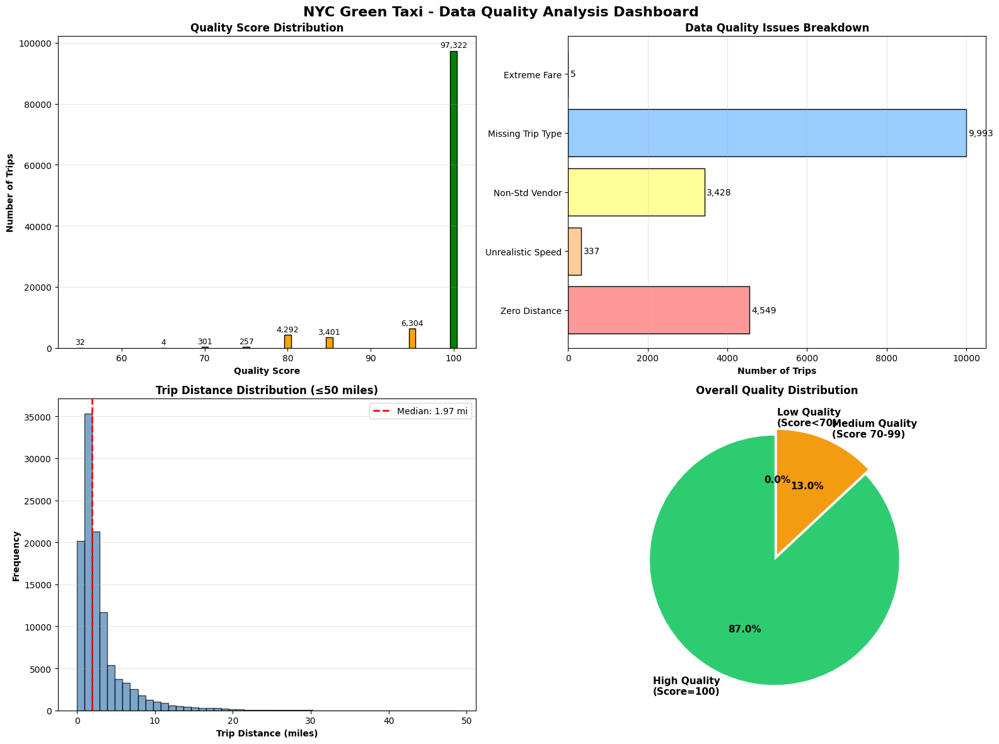


📊 SUMMARY STATISTICS

Total Valid Records (after outlier removal): 111,913
High Quality Records (100%): 97,322 (87.0%)
Medium Quality Records (70-99%): 14,555 (13.0%)
Low Quality Records (<70%): 36 (0.0%)

Average Quality Score: 98.3/100

Data Quality Achievement: 87.0% of records are high quality


In [0]:
import matplotlib.pyplot as plt
import pandas as pd
from pyspark.sql import functions as F

silver_cleaned = spark.table("nyc_taxi.silver.green_taxi").filter(F.col("trip_distance") <= 100)
silver_cleaned = silver_cleaned.withColumn(
    "is_zero_distance", F.when(F.col("trip_distance") == 0, True).otherwise(False)
).withColumn(
    "speed_mph",
    F.when(F.col("trip_duration_minutes") > 0, 
           (F.col("trip_distance") / F.col("trip_duration_minutes")) * 60).otherwise(None)
).withColumn(
    "is_unrealistic_speed", F.when(F.col("speed_mph") > 100, True).otherwise(False)
).withColumn(
    "is_standard_vendor", F.when(F.col("vendor_id").isin([1, 2]), True).otherwise(False)
).withColumn(
    "quality_score",
    (F.lit(100)
     - F.when(F.col("is_zero_distance") == True, 20).otherwise(0)
     - F.when(F.col("is_unrealistic_speed") == True, 30).otherwise(0)
     - F.when(F.col("is_standard_vendor") == False, 10).otherwise(0)
     - F.when(F.col("trip_type").isNull(), 5).otherwise(0)
     - F.when(F.col("fare_amount") > 500, 15).otherwise(0)
    ).cast("integer")
)

# Create visualizations
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('NYC Green Taxi - Data Quality Analysis Dashboard', fontsize=16, fontweight='bold')

# 1. Quality Score Distribution
quality_dist = silver_cleaned.groupBy("quality_score").count().toPandas().sort_values("quality_score")
ax1 = axes[0, 0]
ax1.bar(quality_dist['quality_score'], quality_dist['count'], 
        color=['red' if x < 70 else 'orange' if x < 100 else 'green' for x in quality_dist['quality_score']],
        edgecolor='black')
ax1.set_xlabel('Quality Score', fontweight='bold')
ax1.set_ylabel('Number of Trips', fontweight='bold')
ax1.set_title('Quality Score Distribution', fontweight='bold')
ax1.grid(axis='y', alpha=0.3)
for i, v in enumerate(quality_dist['count']):
    ax1.text(quality_dist['quality_score'].iloc[i], v + 500, f'{v:,}', 
             ha='center', va='bottom', fontsize=9)

# 2. Issue Breakdown
ax2 = axes[0, 1]
issues = [
    ('Zero Distance', silver_cleaned.filter(F.col("is_zero_distance") == True).count()),
    ('Unrealistic Speed', silver_cleaned.filter(F.col("is_unrealistic_speed") == True).count()),
    ('Non-Std Vendor', silver_cleaned.filter(F.col("is_standard_vendor") == False).count()),
    ('Missing Trip Type', silver_cleaned.filter(F.col("trip_type").isNull()).count()),
    ('Extreme Fare', silver_cleaned.filter(F.col("fare_amount") > 500).count())
]
issue_labels, issue_counts = zip(*issues)
colors_issues = ['#ff9999', '#ffcc99', '#ffff99', '#99ccff', '#cc99ff']
ax2.barh(issue_labels, issue_counts, color=colors_issues, edgecolor='black')
ax2.set_xlabel('Number of Trips', fontweight='bold')
ax2.set_title('Data Quality Issues Breakdown', fontweight='bold')
ax2.grid(axis='x', alpha=0.3)
for i, v in enumerate(issue_counts):
    ax2.text(v + 50, i, f'{v:,}', va='center', fontsize=10)

# 3. Trip Distance Distribution (excluding outliers)
ax3 = axes[1, 0]
dist_data = silver_cleaned.filter(F.col("trip_distance") <= 50).select("trip_distance").toPandas()
ax3.hist(dist_data['trip_distance'], bins=50, color='steelblue', edgecolor='black', alpha=0.7)
ax3.axvline(dist_data['trip_distance'].median(), color='red', linestyle='--', linewidth=2, label=f'Median: {dist_data["trip_distance"].median():.2f} mi')
ax3.set_xlabel('Trip Distance (miles)', fontweight='bold')
ax3.set_ylabel('Frequency', fontweight='bold')
ax3.set_title('Trip Distance Distribution (≤50 miles)', fontweight='bold')
ax3.legend()
ax3.grid(axis='y', alpha=0.3)

# 4. Quality Category Pie Chart
ax4 = axes[1, 1]
high_quality = silver_cleaned.filter(F.col('quality_score') == 100).count()
medium_quality = silver_cleaned.filter(F.col('quality_score').between(70, 99)).count()
low_quality = silver_cleaned.filter(F.col('quality_score') < 70).count()

quality_categories = ['High Quality\n(Score=100)', 'Medium Quality\n(Score 70-99)', 'Low Quality\n(Score<70)']
quality_values = [high_quality, medium_quality, low_quality]
colors_quality = ['#2ecc71', '#f39c12', '#e74c3c']
explode = (0.05, 0, 0)

ax4.pie(quality_values, labels=quality_categories, autopct='%1.1f%%', 
        colors=colors_quality, explode=explode, startangle=90, 
        textprops={'fontsize': 11, 'fontweight': 'bold'})
ax4.set_title('Overall Quality Distribution', fontweight='bold')

plt.tight_layout()
plt.show()

# Print Summary Statistics
print("\n" + "="*80)
print("📊 SUMMARY STATISTICS")
print("="*80)
print(f"\nTotal Valid Records (after outlier removal): {silver_cleaned.count():,}")
print(f"High Quality Records (100%): {high_quality:,} ({high_quality/silver_cleaned.count()*100:.1f}%)")
print(f"Medium Quality Records (70-99%): {medium_quality:,} ({medium_quality/silver_cleaned.count()*100:.1f}%)")
print(f"Low Quality Records (<70%): {low_quality:,} ({low_quality/silver_cleaned.count()*100:.1f}%)")
print(f"\nAverage Quality Score: {silver_cleaned.select(F.avg('quality_score')).collect()[0][0]:.1f}/100")
print(f"\nData Quality Achievement: {(high_quality/silver_cleaned.count()*100):.1f}% of records are high quality")

In [0]:
# ============================================================
# OUTLIER DETECTION METHOD 1: INTERQUARTILE RANGE (IQR)
# Detects outliers using the 1.5*IQR rule (Tukey's fences)
# ============================================================

from pyspark.sql import functions as F
import pandas as pd

silver_df = spark.table("nyc_taxi.silver.green_taxi")

print("="*80)
print("METHOD 1: IQR (INTERQUARTILE RANGE) OUTLIER DETECTION")
print("="*80)

# Calculate quartiles and IQR for key numerical columns
numerical_cols = ['trip_distance', 'fare_amount', 'total_amount', 'trip_duration_minutes']

for col_name in numerical_cols:
    print(f"\n{col_name.upper()}:")
    print("-" * 60)
    
    # Calculate quartiles
    quantiles = silver_df.approxQuantile(col_name, [0.25, 0.5, 0.75], 0.01)
    Q1, Q2, Q3 = quantiles[0], quantiles[1], quantiles[2]
    IQR = Q3 - Q1
    
    # Calculate bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Count outliers
    outliers_count = silver_df.filter(
        (F.col(col_name) < lower_bound) | (F.col(col_name) > upper_bound)
    ).count()
    
    total_count = silver_df.count()
    outlier_pct = (outliers_count / total_count) * 100
    
    print(f"  Q1 (25th percentile): {Q1:,.2f}")
    print(f"  Q2 (Median):          {Q2:,.2f}")
    print(f"  Q3 (75th percentile): {Q3:,.2f}")
    print(f"  IQR (Q3 - Q1):        {IQR:,.2f}")
    print(f"  Lower Bound:          {lower_bound:,.2f}")
    print(f"  Upper Bound:          {upper_bound:,.2f}")
    print(f"  Outliers Detected:    {outliers_count:,} ({outlier_pct:.2f}%)")

# Apply IQR method to remove outliers from all numerical columns
print("\n" + "="*80)
print("APPLYING IQR FILTER TO DATASET")
print("="*80)

# Calculate bounds for each column
trip_distance_quantiles = silver_df.approxQuantile('trip_distance', [0.25, 0.75], 0.01)
Q1_dist, Q3_dist = trip_distance_quantiles[0], trip_distance_quantiles[1]
IQR_dist = Q3_dist - Q1_dist
lower_dist = Q1_dist - 1.5 * IQR_dist
upper_dist = Q3_dist + 1.5 * IQR_dist

fare_quantiles = silver_df.approxQuantile('fare_amount', [0.25, 0.75], 0.01)
Q1_fare, Q3_fare = fare_quantiles[0], fare_quantiles[1]
IQR_fare = Q3_fare - Q1_fare
lower_fare = Q1_fare - 1.5 * IQR_fare
upper_fare = Q3_fare + 1.5 * IQR_fare

total_quantiles = silver_df.approxQuantile('total_amount', [0.25, 0.75], 0.01)
Q1_total, Q3_total = total_quantiles[0], total_quantiles[1]
IQR_total = Q3_total - Q1_total
lower_total = Q1_total - 1.5 * IQR_total
upper_total = Q3_total + 1.5 * IQR_total

duration_quantiles = silver_df.approxQuantile('trip_duration_minutes', [0.25, 0.75], 0.01)
Q1_dur, Q3_dur = duration_quantiles[0], duration_quantiles[1]
IQR_dur = Q3_dur - Q1_dur
lower_dur = Q1_dur - 1.5 * IQR_dur
upper_dur = Q3_dur + 1.5 * IQR_dur

# Apply filters
silver_iqr = silver_df.filter(
    (F.col('trip_distance').between(lower_dist, upper_dist)) &
    (F.col('fare_amount').between(lower_fare, upper_fare)) &
    (F.col('total_amount').between(lower_total, upper_total)) &
    (F.col('trip_duration_minutes').between(lower_dur, upper_dur))
)

original_count = silver_df.count()
filtered_count = silver_iqr.count()
removed_count = original_count - filtered_count

print(f"\nOriginal records:     {original_count:,}")
print(f"After IQR filtering:  {filtered_count:,}")
print(f"Records removed:      {removed_count:,} ({(removed_count/original_count)*100:.2f}%)")

# Save for comparison
silver_iqr.createOrReplaceTempView("silver_iqr_filtered")
print("\n✅ IQR-filtered dataset saved to temp view: silver_iqr_filtered")

METHOD 1: IQR (INTERQUARTILE RANGE) OUTLIER DETECTION

TRIP_DISTANCE:
------------------------------------------------------------
  Q1 (25th percentile): 1.18
  Q2 (Median):          1.95
  Q3 (75th percentile): 3.45
  IQR (Q3 - Q1):        2.27
  Lower Bound:          -2.23
  Upper Bound:          6.86
  Outliers Detected:    11,021 (9.84%)

FARE_AMOUNT:
------------------------------------------------------------
  Q1 (25th percentile): 9.30
  Q2 (Median):          14.20
  Q3 (75th percentile): 21.20
  IQR (Q3 - Q1):        11.90
  Lower Bound:          -8.55
  Upper Bound:          39.05
  Outliers Detected:    8,422 (7.52%)

TOTAL_AMOUNT:
------------------------------------------------------------
  Q1 (25th percentile): 14.04
  Q2 (Median):          19.50
  Q3 (75th percentile): 28.44
  IQR (Q3 - Q1):        14.40
  Lower Bound:          -7.56
  Upper Bound:          50.04
  Outliers Detected:    8,139 (7.27%)

TRIP_DURATION_MINUTES:
---------------------------------------------

In [0]:
# ============================================================
# OUTLIER DETECTION METHOD 2: Z-SCORE (STANDARD SCORE)
# Detects outliers using standardized distance from mean
# Typically: |Z| > 3 indicates outliers (99.7% within 3σ)
# ============================================================

from pyspark.sql import functions as F
from pyspark.sql.window import Window

silver_df = spark.table("nyc_taxi.silver.green_taxi")

print("="*80)
print("METHOD 2: Z-SCORE OUTLIER DETECTION")
print("="*80)
print("\nUsing threshold: |Z-score| > 3 (99.7% rule)")

# Calculate mean and standard deviation for each numerical column
numerical_cols = ['trip_distance', 'fare_amount', 'total_amount', 'trip_duration_minutes']

# Calculate statistics
stats_df = silver_df.select(
    *[F.mean(col).alias(f'{col}_mean') for col in numerical_cols],
    *[F.stddev(col).alias(f'{col}_stddev') for col in numerical_cols]
)

stats = stats_df.collect()[0]

# Add Z-score columns
silver_with_zscore = silver_df
for col_name in numerical_cols:
    mean_val = stats[f'{col_name}_mean']
    stddev_val = stats[f'{col_name}_stddev']
    
    silver_with_zscore = silver_with_zscore.withColumn(
        f'{col_name}_zscore',
        (F.col(col_name) - F.lit(mean_val)) / F.lit(stddev_val)
    )
    
    # Count outliers for this column
    outliers_count = silver_with_zscore.filter(
        F.abs(F.col(f'{col_name}_zscore')) > 3
    ).count()
    
    total_count = silver_df.count()
    outlier_pct = (outliers_count / total_count) * 100
    
    print(f"\n{col_name.upper()}:")
    print("-" * 60)
    print(f"  Mean (μ):             {mean_val:,.2f}")
    print(f"  Std Dev (σ):          {stddev_val:,.2f}")
    print(f"  Lower Bound (μ-3σ):   {mean_val - 3*stddev_val:,.2f}")
    print(f"  Upper Bound (μ+3σ):   {mean_val + 3*stddev_val:,.2f}")
    print(f"  Outliers (|Z|>3):     {outliers_count:,} ({outlier_pct:.2f}%)")

# Apply Z-score filter (remove records where ANY column has |Z| > 3)
print("\n" + "="*80)
print("APPLYING Z-SCORE FILTER TO DATASET")
print("="*80)

silver_zscore = silver_with_zscore.filter(
    (F.abs(F.col('trip_distance_zscore')) <= 3) &
    (F.abs(F.col('fare_amount_zscore')) <= 3) &
    (F.abs(F.col('total_amount_zscore')) <= 3) &
    (F.abs(F.col('trip_duration_minutes_zscore')) <= 3)
)

# Drop the z-score columns from final dataset
silver_zscore = silver_zscore.drop(
    'trip_distance_zscore', 'fare_amount_zscore', 
    'total_amount_zscore', 'trip_duration_minutes_zscore'
)

original_count = silver_df.count()
filtered_count = silver_zscore.count()
removed_count = original_count - filtered_count

print(f"\nOriginal records:     {original_count:,}")
print(f"After Z-score filter: {filtered_count:,}")
print(f"Records removed:      {removed_count:,} ({(removed_count/original_count)*100:.2f}%)")

# Save for comparison
silver_zscore.createOrReplaceTempView("silver_zscore_filtered")
print("\n✅ Z-score-filtered dataset saved to temp view: silver_zscore_filtered")

METHOD 2: Z-SCORE OUTLIER DETECTION

Using threshold: |Z-score| > 3 (99.7% rule)

TRIP_DISTANCE:
------------------------------------------------------------
  Mean (μ):             22.70
  Std Dev (σ):          1,266.21
  Lower Bound (μ-3σ):   -3,775.94
  Upper Bound (μ+3σ):   3,821.34
  Outliers (|Z|>3):     58 (0.05%)

FARE_AMOUNT:
------------------------------------------------------------
  Mean (μ):             18.54
  Std Dev (σ):          20.99
  Lower Bound (μ-3σ):   -44.42
  Upper Bound (μ+3σ):   81.50
  Outliers (|Z|>3):     1,207 (1.08%)

TOTAL_AMOUNT:
------------------------------------------------------------
  Mean (μ):             24.99
  Std Dev (σ):          22.54
  Lower Bound (μ-3σ):   -42.62
  Upper Bound (μ+3σ):   92.59
  Outliers (|Z|>3):     1,430 (1.28%)

TRIP_DURATION_MINUTES:
------------------------------------------------------------
  Mean (μ):             20.85
  Std Dev (σ):          82.49
  Lower Bound (μ-3σ):   -226.62
  Upper Bound (μ+3σ):   268.32


In [0]:
# ============================================================
# COMPREHENSIVE COMPARISON OF ALL THREE METHODS
# 1. Simple Threshold (>100 miles)
# 2. IQR Method (Tukey's fences)
# 3. Z-Score Method (|Z| > 3)
# ============================================================

from pyspark.sql import functions as F
import pandas as pd
import matplotlib.pyplot as plt

silver_df = spark.table("nyc_taxi.silver.green_taxi")
silver_threshold = silver_df.filter(F.col("trip_distance") <= 100)
silver_iqr = spark.table("silver_iqr_filtered")
silver_zscore = spark.table("silver_zscore_filtered")

print("="*80)
print("🔍 COMPARISON OF OUTLIER DETECTION METHODS")
print("="*80)

# Count records for each method
original = silver_df.count()
threshold = silver_threshold.count()
iqr = silver_iqr.count()
zscore = silver_zscore.count()

print(f"\n{'Method':<30} {'Records':<15} {'Removed':<15} {'% Removed':<12}")
print("-" * 72)
print(f"{'Original Dataset':<30} {original:>12,}   {0:>12,}   {0:>10.2f}%")
print(f"{'Simple Threshold (>100mi)':<30} {threshold:>12,}   {original-threshold:>12,}   {((original-threshold)/original)*100:>10.2f}%")
print(f"{'IQR Method (1.5*IQR)':<30} {iqr:>12,}   {original-iqr:>12,}   {((original-iqr)/original)*100:>10.2f}%")
print(f"{'Z-Score Method (|Z|>3)':<30} {zscore:>12,}   {original-zscore:>12,}   {((original-zscore)/original)*100:>10.2f}%")

# Statistical comparison for each numerical column
print("\n" + "="*80)
print("STATISTICAL COMPARISON BY COLUMN")
print("="*80)

numerical_cols = ['trip_distance', 'fare_amount', 'total_amount', 'trip_duration_minutes']

comparison_data = []

for col_name in numerical_cols:
    print(f"\n{col_name.upper()}:")
    print("-" * 72)
    
    # Get statistics for each method
    orig_stats = silver_df.select(
        F.min(col_name).alias('min'),
        F.max(col_name).alias('max'),
        F.mean(col_name).alias('mean'),
        F.stddev(col_name).alias('stddev')
    ).collect()[0]
    
    thresh_stats = silver_threshold.select(
        F.min(col_name).alias('min'),
        F.max(col_name).alias('max'),
        F.mean(col_name).alias('mean'),
        F.stddev(col_name).alias('stddev')
    ).collect()[0]
    
    iqr_stats = silver_iqr.select(
        F.min(col_name).alias('min'),
        F.max(col_name).alias('max'),
        F.mean(col_name).alias('mean'),
        F.stddev(col_name).alias('stddev')
    ).collect()[0]
    
    zscore_stats = silver_zscore.select(
        F.min(col_name).alias('min'),
        F.max(col_name).alias('max'),
        F.mean(col_name).alias('mean'),
        F.stddev(col_name).alias('stddev')
    ).collect()[0]
    
    print(f"  {'Method':<20} {'Min':>12} {'Max':>12} {'Mean':>12} {'StdDev':>12}")
    print(f"  {'-'*68}")
    print(f"  {'Original':<20} {orig_stats['min']:>12.2f} {orig_stats['max']:>12.2f} {orig_stats['mean']:>12.2f} {orig_stats['stddev']:>12.2f}")
    print(f"  {'Threshold':<20} {thresh_stats['min']:>12.2f} {thresh_stats['max']:>12.2f} {thresh_stats['mean']:>12.2f} {thresh_stats['stddev']:>12.2f}")
    print(f"  {'IQR':<20} {iqr_stats['min']:>12.2f} {iqr_stats['max']:>12.2f} {iqr_stats['mean']:>12.2f} {iqr_stats['stddev']:>12.2f}")
    print(f"  {'Z-Score':<20} {zscore_stats['min']:>12.2f} {zscore_stats['max']:>12.2f} {zscore_stats['mean']:>12.2f} {zscore_stats['stddev']:>12.2f}")
    
    # Store for visualization
    comparison_data.append({
        'column': col_name,
        'original_mean': orig_stats['mean'],
        'threshold_mean': thresh_stats['mean'],
        'iqr_mean': iqr_stats['mean'],
        'zscore_mean': zscore_stats['mean'],
        'original_max': orig_stats['max'],
        'threshold_max': thresh_stats['max'],
        'iqr_max': iqr_stats['max'],
        'zscore_max': zscore_stats['max']
    })

# Visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Comparison of Outlier Detection Methods - Impact on Dataset', fontsize=16, fontweight='bold')

# 1. Records comparison
ax1 = axes[0, 0]
methods = ['Original', 'Threshold\n(>100mi)', 'IQR\n(1.5*IQR)', 'Z-Score\n(|Z|>3)']
counts = [original, threshold, iqr, zscore]
colors = ['#3498db', '#2ecc71', '#f39c12', '#9b59b6']
ax1.bar(methods, counts, color=colors, edgecolor='black', linewidth=1.5)
ax1.set_ylabel('Number of Records', fontweight='bold')
ax1.set_title('Dataset Size After Each Method', fontweight='bold')
ax1.grid(axis='y', alpha=0.3)
for i, v in enumerate(counts):
    ax1.text(i, v + 500, f'{v:,}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# 2. Percentage removed
ax2 = axes[0, 1]
removed_pcts = [
    0,
    ((original-threshold)/original)*100,
    ((original-iqr)/original)*100,
    ((original-zscore)/original)*100
]
ax2.bar(methods, removed_pcts, color=colors, edgecolor='black', linewidth=1.5)
ax2.set_ylabel('% Records Removed', fontweight='bold')
ax2.set_title('Aggressiveness of Each Method', fontweight='bold')
ax2.grid(axis='y', alpha=0.3)
for i, v in enumerate(removed_pcts):
    ax2.text(i, v + 0.5, f'{v:.2f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')

# 3. Trip distance mean comparison
ax3 = axes[1, 0]
dist_means = [
    comparison_data[0]['original_mean'],
    comparison_data[0]['threshold_mean'],
    comparison_data[0]['iqr_mean'],
    comparison_data[0]['zscore_mean']
]
ax3.bar(methods, dist_means, color=colors, edgecolor='black', linewidth=1.5)
ax3.set_ylabel('Average Trip Distance (miles)', fontweight='bold')
ax3.set_title('Impact on Trip Distance Mean', fontweight='bold')
ax3.grid(axis='y', alpha=0.3)
for i, v in enumerate(dist_means):
    ax3.text(i, v + 0.2, f'{v:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# 4. Max values comparison
ax4 = axes[1, 1]
max_distances = [
    comparison_data[0]['original_max'],
    comparison_data[0]['threshold_max'],
    comparison_data[0]['iqr_max'],
    comparison_data[0]['zscore_max']
]
ax4.bar(methods, max_distances, color=colors, edgecolor='black', linewidth=1.5)
ax4.set_ylabel('Maximum Trip Distance (miles)', fontweight='bold')
ax4.set_title('Impact on Extreme Values', fontweight='bold')
ax4.grid(axis='y', alpha=0.3)
ax4.set_yscale('log')  # Log scale to show extreme differences
for i, v in enumerate(max_distances):
    ax4.text(i, v * 1.1, f'{v:.1f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("🎯 RECOMMENDATIONS")
print("="*80)
print("""
1. SIMPLE THRESHOLD (>100 miles):
   ✅ Pros: Very simple, targets only extreme outliers
   ❌ Cons: Arbitrary cutoff, misses subtle outliers
   🎯 Best for: Quick cleaning when extreme values are obvious
   
2. IQR METHOD (1.5*IQR):
   ✅ Pros: Robust to extreme outliers, standard statistical method
   ❌ Cons: Can be too aggressive (removes ~15% of data)
   🎯 Best for: Thorough cleaning, statistical analysis
   
3. Z-SCORE METHOD (|Z|>3):
   ✅ Pros: Based on normal distribution, well-understood threshold
   ❌ Cons: Assumes normality, sensitive to extreme outliers
   🎯 Best for: Normally-distributed data, moderate cleaning

🎯 RECOMMENDED APPROACH:
   - For EXPLORATORY ANALYSIS: Use Z-Score (balanced approach)
   - For PRODUCTION PIPELINES: Use IQR (most robust)
   - For QUICK DASHBOARDS: Use Simple Threshold (fastest)
""")

In [0]:

evaluate_key_combinations(bronze_df.filter(F.col('total_amount')>=0), combinations_list=[['lpep_pickup_datetime', 'lpep_dropoff_datetime','PULocationID','DOLocationID']])

📊 Analyse de 1 combinaisons pour 112,099 lignes totales...

====== RÉSULTATS DE L'ÉVALUATION ======

1. Combinaison : ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID', 'DOLocationID'] [💎 PK VALIDE]
   • Cardinalité (Lignes uniques) : 112,099 / 112,099
   • Taux d'unicité : 100.0000%
   • Robustesse : ✅ Sans Nulls


[{'combo': ['lpep_pickup_datetime',
   'lpep_dropoff_datetime',
   'PULocationID',
   'DOLocationID'],
  'unique_count': 112099,
  'unicity_pct': 100.0,
  'has_nulls': False,
  'null_status': '✅ Sans Nulls'}]

In [0]:
duplicates = get_non_unique_rows(bronze_df.withColumn(),['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID', 'DOLocationID',])

🔍 Recherche des doublons pour la combinaison : ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID', 'DOLocationID']...

⚠️ Alerte Doublons :
   • 634 lignes totales sont impliquées dans des doublons.
   • Il y a 317 valeur(s) de combinaison distincte(s) qui se répètent.

Affichage des 20 premières lignes dupliquées (ordonnées par groupe) :
+--------+--------------------+---------------------+------------------+----------+------------+------------+---------------+-------------+-----------+-----+-------+----------+------------+---------+---------------------+------------+------------+---------+--------------------+-------------+------------------+-----------------+
|VendorID|lpep_pickup_datetime|lpep_dropoff_datetime|store_and_fwd_flag|RatecodeID|PULocationID|DOLocationID|passenger_count|trip_distance|fare_amount|extra|mta_tax|tip_amount|tolls_amount|ehail_fee|improvement_surcharge|total_amount|payment_type|trip_type|congestion_surcharge|_rescued_data|cbd_congestion_fee|_cou

In [0]:

from datetime import datetime
combo = ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID', 'DOLocationID']
current_timestamp = datetime.now().strftime("%Y_%m_%d_%H_%M")

spark.sql("CREATE SCHEMA IF NOT EXISTS nyc_taxi.quranatine")
duplicates.write.mode("overwrite").saveAsTable(f"nyc_taxi.quranatine.taxi_trips_duplicates_{current_timestamp}_for_{"_".join(combo)}")
duplicates.write.mode("overwrite").saveAsTable(f"nyc_taxi.quranatine.taxi_trips_duplicates_latest")

In [0]:
import pyspark.sql.functions as F


silver_df = spark.table('nyc_taxi.silver.green_taxi')

duplicates = spark.table('nyc_taxi.quranatine.taxi_trips_duplicates_latest')

# Collect the distinct values from duplicates table
do_locations = [row.DOLocationID for row in duplicates.select('DOLocationID').distinct().collect()]
pu_locations = [row.PULocationID for row in duplicates.select('PULocationID').distinct().collect()]
dropoff_times = [row.lpep_dropoff_datetime for row in duplicates.select('lpep_dropoff_datetime').distinct().collect()]
pickup_times = [row.lpep_pickup_datetime for row in duplicates.select('lpep_pickup_datetime').distinct().collect()]

silver_df.where(
    (F.col('DOLocationID').isin(do_locations))
    &
    (F.col('PULocationID').isin(pu_locations))  
    &
    (F.col('dropoff_datetime').isin(dropoff_times))  
    &
    (F.col('pickup_datetime').isin(pickup_times))    
    ).display()


trip_id,vendor_id,pickup_datetime,dropoff_datetime,trip_duration_minutes,passenger_count,trip_distance,fare_per_mile,PULocationID,DOLocationID,rate_code_id,store_and_fwd_flag,payment_type,tip_amount,tip_percentage,fare_amount,extra,mta_tax,improvement_surcharge,tolls_amount,total_amount,trip_type,pickup_hour,pickup_day_of_week
f8a01327a9c2117adc85698482f5d5e829b0474981a001cbcd8cb4ca9a488b04,2,2023-12-01T02:41:41.000Z,2023-12-01T02:46:37.000Z,4.93,1,0.05,4400.0,80,80,5,N,3,0.0,0.0,220.0,0.0,0.0,1.0,0.0,221.0,2,2,6
e3d98ce589410db37bd229ab00b053d3e784deeed927d89fc6ea3873e5a893c2,2,2023-12-01T10:22:49.000Z,2023-12-01T10:22:58.000Z,0.15,1,0.0,null,7,7,1,N,3,0.0,0.0,3.0,0.0,0.5,1.0,0.0,4.5,1,10,6
fee8c3a5275b82e7f5b67ad58d6a902ec14f9e0fce0c850642044042cf98243b,2,2023-12-01T10:32:07.000Z,2023-12-01T10:32:49.000Z,0.7,1,0.35,69.71,41,41,3,N,3,0.0,0.0,24.4,0.0,0.0,1.0,0.0,25.4,1,10,6
077a954769a69ef3dcb37c99813613fa490b60765192cedf2f91c8cc0394dffa,2,2023-12-01T12:26:13.000Z,2023-12-01T12:26:20.000Z,0.12,2,0.0,null,223,223,5,N,3,0.0,0.0,25.0,0.0,0.0,1.0,0.0,26.0,2,12,6
99ff5b5eab311610ba88a13180ffe26a4ad10231874a6c6669e46ef942c2af21,2,2023-12-01T12:35:07.000Z,2023-12-01T12:35:26.000Z,0.32,1,0.0,null,95,95,1,N,3,0.0,0.0,3.0,0.0,0.5,1.0,0.0,4.5,1,12,6
a51acd57b5c83120bfe39902654dac94082409c73dab49e1b5c4fe4c6d355097,2,2023-12-01T15:39:19.000Z,2023-12-01T15:40:59.000Z,1.67,1,0.08,46.25,95,95,1,N,3,0.0,0.0,3.7,0.0,0.5,1.0,0.0,5.2,1,15,6
09c206b58a372f2160b840bf4fccf1c001b6a1fd7ddd859c450c18936b969c60,2,2023-12-01T17:36:52.000Z,2023-12-01T17:43:40.000Z,6.8,5,0.06,120.0,74,74,1,N,3,0.0,0.0,7.2,2.5,0.5,1.0,0.0,11.2,1,17,6
e10242e32d2c373d8a77167eb7c7e96fcd2e8671901c0dd31494ba7620157cbc,2,2023-12-01T19:03:35.000Z,2023-12-01T19:03:52.000Z,0.28,3,0.0,null,75,75,1,N,3,0.0,0.0,3.0,2.5,0.5,1.0,0.0,7.0,1,19,6
ae673f8e61486fc275cfdd6daf8be8cf26df8dc02ae8b981bb2da212fc1ff813,2,2023-12-01T19:16:07.000Z,2023-12-01T19:22:13.000Z,6.1,1,0.57,12.63,129,129,1,N,3,0.0,0.0,7.2,2.5,0.5,1.0,0.0,11.2,1,19,6
6d9acb79788135b976242f742d14cf75eee671f44ac8fb2b6c24b602085b2293,2,2023-12-02T03:54:19.000Z,2023-12-02T03:54:43.000Z,0.4,1,0.0,null,174,174,5,N,3,0.0,0.0,25.0,0.0,0.0,1.0,0.0,26.0,2,3,7


In [0]:
bronze_df.columns

['VendorID',
 'lpep_pickup_datetime',
 'lpep_dropoff_datetime',
 'store_and_fwd_flag',
 'RatecodeID',
 'PULocationID',
 'DOLocationID',
 'passenger_count',
 'trip_distance',
 'fare_amount',
 'extra',
 'mta_tax',
 'tip_amount',
 'tolls_amount',
 'ehail_fee',
 'improvement_surcharge',
 'total_amount',
 'payment_type',
 'trip_type',
 'congestion_surcharge',
 '_rescued_data',
 'cbd_congestion_fee']

In [0]:
evaluation = evaluate_key_combinations(bronze_df, [['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID', 'DOLocationID',]])

📊 Analyse de 1 combinaisons pour 112,420 lignes totales...

====== RÉSULTATS DE L'ÉVALUATION ======

1. Combinaison : ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID', 'DOLocationID'] [❌ INVALIDE]
   • Cardinalité (Lignes uniques) : 112,103 / 112,420
   • Taux d'unicité : 99.7180%
   • Robustesse : ✅ Sans Nulls


In [0]:
pk = find_primary_key_combo(bronze_df,bronze_df.columns, max_combo_size=len(bronze_df.columns))

Nombre total de lignes dans le DataFrame : 112420

Étape 1 : Analyse de la cardinalité individuelle...

Étape 2 : Recherche de la meilleure combinaison...
Test de la combinaison ['lpep_pickup_datetime'] -> Unicité : 97.74% (109883/112420)
Test de la combinaison ['lpep_pickup_datetime', 'lpep_dropoff_datetime'] -> Unicité : 99.70% (112088/112420)
Test de la combinaison ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'total_amount'] -> Unicité : 100.00% (112417/112420)
Test de la combinaison ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'total_amount', 'fare_amount'] -> Unicité : 100.00% (112417/112420)
Test de la combinaison ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'total_amount', 'fare_amount', 'trip_distance'] -> Unicité : 100.00% (112420/112420)

🎉 Clé primaire trouvée ! La meilleure combinaison est : ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'total_amount', 'fare_amount', 'trip_distance']


In [0]:
# Databricks notebook source
from pyspark.sql.functions import (
    col, to_timestamp, unix_timestamp, when, lit, round, 
    sum as spark_sum, abs, isnan, count, sha2, concat_ws, hour, dayofweek
)
from pyspark.sql.types import IntegerType, DoubleType, StringType,TimestampType
import pyspark.sql.functions as F
# ============================================================
# STEP 1: Read Bronze
# ================  ============================================
bronze_df = spark.table("nyc_taxi.bronze.green_taxi")

# ============================================================
# STEP 2: Cast and Standardize Data Types
# ============================================================


cast_rules = {
    # Timestamps
    "lpep_pickup_datetime": TimestampType(),
    "lpep_dropoff_datetime": TimestampType(),
    # Numeric IDs
    "VendorID": IntegerType(), 
    "RatecodeID": IntegerType(),
    "payment_type": IntegerType(),  
    "passenger_count": IntegerType(),   
    # Monetary fields
    "fare_amount": DoubleType(),
    "extra": DoubleType(),   
    "mta_tax": DoubleType(),  
    "improvement_surcharge": DoubleType(),    
    "tip_amount": DoubleType(),    
    "tolls_amount": DoubleType(),    
    "total_amount": DoubleType(),    
    "trip_distance": DoubleType(),    
    # Coordinates
    "pickup_longitude": DoubleType(),
    "pickup_latitude": DoubleType(),    
    "dropoff_longitude": DoubleType(),    
    "dropoff_latitude": DoubleType(),    

}


df = bronze_df
for column_name, data_type in cast_rules.items():
    if column_name in df.columns:
        df = df.withColumn(column_name, col(column_name).cast(data_type))
    else:
        # Optional: add a default null column so downstream code doesn't break
        df = df.withColumn(column_name, lit(None).cast(data_type))

silver_df = df

# ============================================================
# STEP 3: Clean Nulls and Invalid Values
# ============================================================

# silver_df_cached_std = silver_df.cache()


silver_df = (silver_df
    # Passenger count: null or 0 → assume 1; cap at 6
    .withColumn("passenger_count", 
        when(col("passenger_count").isNull() | (col("passenger_count") <= 0), lit(1))
        .when(col("passenger_count") > 6, lit(6))
        .otherwise(col("passenger_count"))
    )
    
    # Payment type: null or outside 1-6 → 5 (Unknown)
    .withColumn("payment_type",
        when(col("payment_type").isNull() | (col("payment_type") < 1) | (col("payment_type") > 6), lit(5))
        .otherwise(col("payment_type"))
    )
    
    # Rate code: null or outside 1-6 → 1 (Standard)
    .withColumn("RatecodeID",
        when(col("RatecodeID").isNull() | (col("RatecodeID") < 1) | (col("RatecodeID") > 6), lit(1))
        .otherwise(col("RatecodeID"))
    )
)

# ============================================================
# STEP 4: Derive New Columns (Business Logic)
# ============================================================
# silver_df_cached_clean = silver_df.cache()

silver_df = (silver_df
    .withColumn('trip_id', 
        sha2(concat_ws("||", col("lpep_pickup_datetime"), col("lpep_dropoff_datetime"), col("PULocationID"),col("DOLocationID") ),256)
    )
    # Trip duration in minutes
    .withColumn("trip_duration_minutes",
        round((unix_timestamp(col("lpep_dropoff_datetime")) - unix_timestamp(col("lpep_pickup_datetime"))) / 60, 2)
    )
    
    # Fare per mile (for anomaly detection)
    .withColumn("fare_per_mile",
        when(col("trip_distance") > 0, round(col("fare_amount") / col("trip_distance"), 2))
        .otherwise(lit(None))
    )
    
    # Tip percentage (credit card tips only; cash is 0 in raw data)
    .withColumn("tip_percentage",
        when(col("fare_amount") > 0, round((col("tip_amount") / col("fare_amount")) * 100, 2))
        .otherwise(lit(0.0))
    )
    
    # Hour of day and day of week for analytics
    .withColumn("pickup_hour", hour(col("lpep_pickup_datetime")))
    .withColumn("pickup_day_of_week", dayofweek(col("lpep_pickup_datetime")))
)

# ============================================================
# STEP 5: Filter Invalid Rows (Data Quality)
# ============================================================


silver_df = (silver_df
    # Drop rows with impossible timestamps
    .filter(col("lpep_pickup_datetime").isNotNull())
    .filter(col("lpep_dropoff_datetime").isNotNull())
    .filter(col("lpep_dropoff_datetime") > col("lpep_pickup_datetime"))
    
    # Drop rows with null island coordinates or out-of-range NYC
    #.filter((col("pickup_latitude") != 0) & (col("pickup_longitude") != 0))
    #.filter((col("pickup_latitude").between(40.4, 41.0)))
    #.filter((col("pickup_longitude").between(-74.3, -73.6)))
    .filter(col("DOLocationID")!=col("PULocationID"))
    # Drop rows with zero or negative distance
    #.filter(col("trip_distance") > 0)
    
    # Drop rows with negative monetary amounts (data corruption)
    .filter(col("fare_amount") >= 0)
    .filter(col("total_amount") >= 0)
    
    # Drop rows where trip duration is negative or > 24 hours (likely bad data)
    .filter((col("trip_duration_minutes") > 0) & (col("trip_duration_minutes") <= 1440))
    .filter(F.col("trip_distance")!=0)
    # .filter(~((F.col("trip_distance")==0) & (F.date_diff(F.col("lpep_dropoff_datetime"),F.col("lpep_pickup_datetime").cast('int')) == 0 ) ) )
)






# ============================================================
# STEP 7: Select Final Columns (Drop Raw String Columns)
# ============================================================

silver_df = silver_df.select(
    "trip_id",
    col("VendorID").alias("vendor_id"),
    col("lpep_pickup_datetime").alias("pickup_datetime"),
    col("lpep_dropoff_datetime").alias("dropoff_datetime"),
    "trip_duration_minutes",
    "passenger_count",
    "trip_distance",
    "fare_per_mile",
    "PULocationID",
    "DOLocationID",
    col("RatecodeID").alias("rate_code_id"),
    "store_and_fwd_flag",
    "payment_type",
    "tip_amount",
    "tip_percentage",
    "fare_amount",
    "extra",
    "mta_tax",
    "improvement_surcharge",
    "tolls_amount",
    "total_amount",
    "trip_type",
    "pickup_hour",
    "pickup_day_of_week"
)


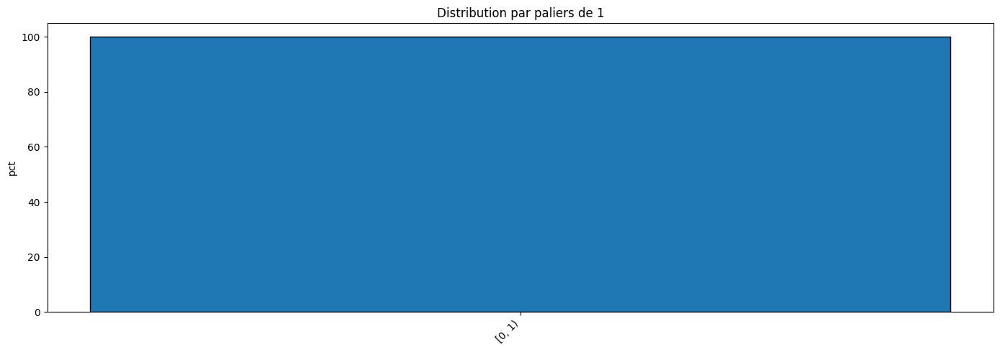

In [0]:
import pyspark.sql.functions as F
from pyspark.ml.feature import Bucketizer
import numpy as np

df = silver_df.filter(F.col("trip_distance")==0 )

INTERVAL_LENGTH =1
splits = list(np.arange(0, 201, INTERVAL_LENGTH)) + [float('inf')]
bucketizer = Bucketizer(splits=splits, inputCol="trip_distance", outputCol="bin_index")
df_bucketed = bucketizer.transform(df)
df_summary = df_bucketed.groupBy("bin_index").count().orderBy("bin_index").toPandas()
df_summary["pct"] = df_summary["count"]/df_summary["count"].sum() *100
df_summary["bin_label"] = df_summary["bin_index"].apply(
    lambda idx: f"[{int(idx*INTERVAL_LENGTH)}, {int((idx+1)*INTERVAL_LENGTH)})" if idx < len(splits)-2 else f">={int(idx*INTERVAL_LENGTH)}"
)


plt.figure(figsize=(14, 5))
plt.bar(df_summary["bin_label"], df_summary["pct"], edgecolor="black")
plt.xticks(rotation=45, ha="right")
plt.ylabel("pct")
plt.title(f"Distribution par paliers de {INTERVAL_LENGTH}")
plt.tight_layout()
plt.show()

    

In [0]:
silver_df.filter((F.col("trip_distance")==0) ).plot.hist("trip_duration_minutes",bins=15)

In [0]:
from delta.tables import DeltaTable

table_name = "nyc_taxi.silver.green_taxi"

# Check if the table exists in the catalog
if spark.catalog.tableExists(table_name):
    # Table exists: Load by name and upsert
    target_table = DeltaTable.forName(spark, table_name)
    
    target_table.alias("target").merge(
        silver_df.alias("source"), 
        "target.trip_id = source.trip_id"
    ).whenMatchedUpdateAll().whenNotMatchedInsertAll().execute()
    
else:
    # Table does not exist: Save the dataframe to create it
    silver_df.write.format("delta").mode("saveAsTable").saveAsTable(table_name)


In [0]:
from pyspark.sql.functions import col, count, when, isnan, lit, sum as spark_sum, min, max, avg, stddev
import json

# ============================================================
# DATA QUALITY FRAMEWORK FOR SILVER LAYER
# ============================================================

silver_table = spark.table("nyc_taxi.silver.green_taxi")
total_records = silver_table.count()

print(f"\n{'='*70}")
print(f"🔍 DATA QUALITY REPORT - nyc_taxi.silver.green_taxi")
print(f"{'='*70}")
print(f"Total Records: {total_records:,}\n")

quality_results = {}

# ============================================================
# CHECK 1: COMPLETENESS - Critical Fields Should Not Be Null
# ============================================================
print("\n[CHECK 1] COMPLETENESS - Null Values in Critical Fields")
print("-" * 70)

critical_fields = [
    "trip_id", "vendor_id", "pickup_datetime", "dropoff_datetime",
    "PULocationID", "DOLocationID", "trip_distance", "total_amount"
]

null_checks = []
for field in critical_fields:
    null_count = silver_table.filter(col(field).isNull()).count()
    null_pct = (null_count / total_records) * 100 if total_records > 0 else 0
    status = "✅ PASS" if null_count == 0 else "❌ FAIL"
    print(f"{status} | {field:25s} | Nulls: {null_count:6,} ({null_pct:.2f}%)")
    null_checks.append({"field": field, "null_count": null_count, "null_pct": null_pct})

quality_results["completeness"] = null_checks

# ============================================================
# CHECK 2: UNIQUENESS - Primary Key Check
# ============================================================
print("\n[CHECK 2] UNIQUENESS - Primary Key Validation")
print("-" * 70)

distinct_trip_ids = silver_table.select("trip_id").distinct().count()
duplicates = total_records - distinct_trip_ids
duplication_rate = (duplicates / total_records) * 100 if total_records > 0 else 0

if duplicates == 0:
    print(f"✅ PASS | trip_id is unique ({distinct_trip_ids:,} unique values)")
else:
    print(f"❌ FAIL | Found {duplicates:,} duplicate trip_ids ({duplication_rate:.2f}% duplication rate)")

quality_results["uniqueness"] = {"duplicates": duplicates, "duplication_rate": duplication_rate}

# ============================================================
# CHECK 3: VALIDITY - Business Rules & Data Ranges
# ============================================================
print("\n[CHECK 3] VALIDITY - Business Rules Compliance")
print("-" * 70)

validity_checks = [
    ("Negative fares", silver_table.filter(col("fare_amount") < 0).count()),
    ("Negative total amounts", silver_table.filter(col("total_amount") < 0).count()),
    ("Zero trip distance", silver_table.filter(col("trip_distance") == 0).count()),
    ("Trip duration > 24 hours", silver_table.filter(col("trip_duration_minutes") > 1440).count()),
    ("Trip duration <= 0", silver_table.filter(col("trip_duration_minutes") <= 0).count()),
    ("Passenger count = 0", silver_table.filter(col("passenger_count") == 0).count()),
    ("Passenger count > 6", silver_table.filter(col("passenger_count") > 6).count()),
    ("Pickup after dropoff", silver_table.filter(col("pickup_datetime") >= col("dropoff_datetime")).count()),
]

validity_results = []
for rule_name, violation_count in validity_checks:
    violation_pct = (violation_count / total_records) * 100 if total_records > 0 else 0
    status = "✅ PASS" if violation_count == 0 else "⚠️ WARN"
    print(f"{status} | {rule_name:30s} | Violations: {violation_count:6,} ({violation_pct:.2f}%)")
    validity_results.append({"rule": rule_name, "violations": violation_count, "violation_pct": violation_pct})

quality_results["validity"] = validity_results

# ============================================================
# CHECK 4: CONSISTENCY - Referential Integrity
# ============================================================
print("\n[CHECK 4] CONSISTENCY - Location ID Integrity")
print("-" * 70)

# Assuming valid NYC location IDs are between 1 and 265 (TLC standard)
invalid_pu = silver_table.filter((col("PULocationID") < 1) | (col("PULocationID") > 265)).count()
invalid_do = silver_table.filter((col("DOLocationID") < 1) | (col("DOLocationID") > 265)).count()

pu_status = "✅ PASS" if invalid_pu == 0 else "❌ FAIL"
do_status = "✅ PASS" if invalid_do == 0 else "❌ FAIL"

print(f"{pu_status} | Invalid PULocationID (outside 1-265) | Count: {invalid_pu:,}")
print(f"{do_status} | Invalid DOLocationID (outside 1-265) | Count: {invalid_do:,}")

quality_results["consistency"] = {
    "invalid_pickup_locations": invalid_pu,
    "invalid_dropoff_locations": invalid_do
}

# ============================================================
# CHECK 5: ACCURACY - Statistical Outliers
# ============================================================
print("\n[CHECK 5] ACCURACY - Statistical Summary")
print("-" * 70)

stats = silver_table.select(
    avg("fare_amount").alias("avg_fare"),
    stddev("fare_amount").alias("stddev_fare"),
    min("fare_amount").alias("min_fare"),
    max("fare_amount").alias("max_fare"),
    avg("trip_distance").alias("avg_distance"),
    max("trip_distance").alias("max_distance"),
    avg("trip_duration_minutes").alias("avg_duration"),
    max("trip_duration_minutes").alias("max_duration")
).collect()[0]

# Handle None values in stats
avg_fare = stats['avg_fare'] if stats['avg_fare'] is not None else 0.0
stddev_fare = stats['stddev_fare'] if stats['stddev_fare'] is not None else 0.0
min_fare = stats['min_fare'] if stats['min_fare'] is not None else 0.0
max_fare = stats['max_fare'] if stats['max_fare'] is not None else 0.0
avg_distance = stats['avg_distance'] if stats['avg_distance'] is not None else 0.0
max_distance = stats['max_distance'] if stats['max_distance'] is not None else 0.0
avg_duration = stats['avg_duration'] if stats['avg_duration'] is not None else 0.0
max_duration = stats['max_duration'] if stats['max_duration'] is not None else 0.0

print(f"Fare Amount:     Avg=${avg_fare:.2f} | StdDev=${stddev_fare:.2f} | Min=${min_fare:.2f} | Max=${max_fare:.2f}")
print(f"Trip Distance:   Avg={avg_distance:.2f} mi | Max={max_distance:.2f} mi")
print(f"Trip Duration:   Avg={avg_duration:.2f} min | Max={max_duration:.2f} min")

# Detect extreme outliers (3 standard deviations)
fare_upper_bound = avg_fare + (3 * stddev_fare) if stddev_fare > 0 else avg_fare + 100
extreme_fares = silver_table.filter(col("fare_amount") > fare_upper_bound).count()
extreme_distances = silver_table.filter(col("trip_distance") > 100).count()

print(f"\n⚠️ Extreme outliers detected:")
print(f"   - Fares > ${fare_upper_bound:.2f} (3σ): {extreme_fares:,} trips")
print(f"   - Distances > 100 miles: {extreme_distances:,} trips")

quality_results["accuracy"] = {
    "extreme_fares": extreme_fares,
    "extreme_distances": extreme_distances,
    "stats": {k: float(v) if v is not None else None for k, v in stats.asDict().items()}
}

# ============================================================
# SUMMARY
# ============================================================
print(f"\n{'='*70}")
print("📊 QUALITY SCORE SUMMARY")
print(f"{'='*70}")

total_checks = len(critical_fields) + 1 + len(validity_checks) + 2  # completeness + uniqueness + validity + consistency
passed_checks = (
    sum(1 for check in null_checks if check['null_count'] == 0) +
    (1 if duplicates == 0 else 0) +
    sum(1 for check in validity_results if check['violations'] == 0) +
    (1 if invalid_pu == 0 else 0) +
    (1 if invalid_do == 0 else 0)
)

quality_score = (passed_checks / total_checks) * 100
print(f"\nOverall Quality Score: {quality_score:.1f}% ({passed_checks}/{total_checks} checks passed)")

if quality_score >= 95:
    print("✅ EXCELLENT - Data is production-ready")
elif quality_score >= 80:
    print("⚠️ GOOD - Minor issues detected, review recommended")
else:
    print("❌ CRITICAL - Significant data quality issues require attention")

quality_results["summary"] = {
    "total_checks": total_checks,
    "passed_checks": passed_checks,
    "quality_score": quality_score
}

print(f"\n{'='*70}\n")

# ============================================================
# SAVE RESULTS TO TABLE FOR DASHBOARD
# ============================================================
from datetime import datetime
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, DoubleType, TimestampType, ArrayType

# Add timestamp for tracking
quality_results["run_timestamp"] = datetime.now().isoformat()
quality_results["table_name"] = "nyc_taxi.silver.green_taxi"
quality_results["total_records"] = total_records

# Convert results to DataFrame
quality_df = spark.createDataFrame([
    {
        "run_timestamp": quality_results["run_timestamp"],
        "table_name": quality_results["table_name"],
        "total_records": quality_results["total_records"],
        "quality_score": quality_results["summary"]["quality_score"],
        "total_checks": quality_results["summary"]["total_checks"],
        "passed_checks": quality_results["summary"]["passed_checks"],
        "completeness_results": json.dumps(quality_results["completeness"]),
        "uniqueness_duplicates": quality_results["uniqueness"]["duplicates"],
        "uniqueness_duplication_rate": quality_results["uniqueness"]["duplication_rate"],
        "validity_results": json.dumps(quality_results["validity"]),
        "consistency_invalid_pickup": quality_results["consistency"]["invalid_pickup_locations"],
        "consistency_invalid_dropoff": quality_results["consistency"]["invalid_dropoff_locations"],
        "accuracy_extreme_fares": quality_results["accuracy"]["extreme_fares"],
        "accuracy_extreme_distances": quality_results["accuracy"]["extreme_distances"],
        "accuracy_stats": json.dumps(quality_results["accuracy"]["stats"])
    }
])

# Save to Unity Catalog table
target_table = "nyc_taxi.silver.data_quality_results"
quality_df.write.mode("append").saveAsTable(target_table)

print(f"✅ Quality results saved to {target_table}")


🔍 DATA QUALITY REPORT - nyc_taxi.silver.green_taxi
Total Records: 111,975


[CHECK 1] COMPLETENESS - Null Values in Critical Fields
----------------------------------------------------------------------
✅ PASS | trip_id                   | Nulls:      0 (0.00%)
✅ PASS | vendor_id                 | Nulls:      0 (0.00%)
✅ PASS | pickup_datetime           | Nulls:      0 (0.00%)
✅ PASS | dropoff_datetime          | Nulls:      0 (0.00%)
✅ PASS | PULocationID              | Nulls:      0 (0.00%)
✅ PASS | DOLocationID              | Nulls:      0 (0.00%)
✅ PASS | trip_distance             | Nulls:      0 (0.00%)
✅ PASS | total_amount              | Nulls:      0 (0.00%)

[CHECK 2] UNIQUENESS - Primary Key Validation
----------------------------------------------------------------------
✅ PASS | trip_id is unique (111,975 unique values)

[CHECK 3] VALIDITY - Business Rules Compliance
----------------------------------------------------------------------
✅ PASS | Negative fares             

In [0]:
%sql
select Payment_type,count(*) as count from nyc_taxi.silver.green_taxi
where trip_distance = 0
group by Payment_type
order by count desc

Payment_type,count
1,3116
2,984
5,257
3,156
4,36


In [0]:
%sql
select trip_id , 
  trip_duration_minutes,
  concat(
    lpad(cast(floor(trip_duration_minutes / 60) as string), 2, '0'),
    ':',
    lpad(cast(cast(trip_duration_minutes % 60 as int) as string), 2, '0'),
    ':',
    lpad(cast(cast((trip_duration_minutes % 1) * 60 as int) as string), 2, '0')
  ) as duration_formatted
from nyc_taxi.silver.green_taxi
where trip_distance = 0
order by trip_duration_minutes  desc

trip_id,trip_duration_minutes,duration_formatted
9d4a942994d2463899711dd9c7df1c0dd1c638208c2e07500483fb58b13a1c57,1439.85,23:59:50
5bd4d7013b9ccb66f4403376e10fb394bd0ebdaabff728b87978a2d68b7e91a0,1438.98,23:58:58
bd03f0eccec540cb9005a2dba20bc6715ed8a5eeeaba20761436b268bfbe7e81,1437.33,23:57:19
f25e78744513f0d130ff617a9d3d358929e1eec316e4c1ba199efad80311667e,1400.0,23:20:00
64301e2bedcafc56db3bd21085088b05feac895946d2bffb9d19833b9dc6ab61,1396.88,23:16:52
fd994b955c15da6246976a713c9bdf694155ed14e6bfcf9051200baafd5bb6e9,1395.05,23:15:02
376227d083cc76415610800820df49bc22a61b88f73107fd911632762943c989,1390.2,23:10:12
36d7733afb2b25667f2e277785c597864fdf010aa193c0ba148d8b298ef9aaf2,1383.43,23:03:25
1a420172a93b7c5733364b906d73a4869f62f89fda3c21dc159177aa1c3ee464,1382.27,23:02:16
9bd022438d5d9dd8a2cb5afe9c6d24dc2868a2819289868f4ceb79f40cc0ac3d,1323.63,22:03:37


In [0]:
# ============================================================
# Data Quality Validation — Run after Silver write
# ============================================================
# Exam objective: "Apply data quality checks and validation rules"
# Doc: https://docs.databricks.com/en/delta/tutorial.html

validation_df = spark.table("nyc_taxi.silver.green_taxi")

# Check 1: No nulls in critical columns
null_counts = validation_df.select([
    count(when(col(c).isNull(), c)).alias(c) 
    for c in ["vendor_id", "pickup_datetime", "trip_distance", "fare_amount", "total_amount"]
])
null_counts.display()

# Check 2: Total amount checksum (within $0.50 tolerance)
# Total should ≈ Fare + Extra + MTA_tax + Improvement_surcharge + Tip + Tolls
checksum = (validation_df
    .withColumn("computed_total", 
        round(col("fare_amount") + col("extra") + col("mta_tax") + 
              col("improvement_surcharge") + col("tip_amount") + col("tolls_amount"), 2))
    .withColumn("total_diff", abs(col("total_amount") - col("computed_total")))
    .filter(col("total_diff") > 0.50)
)
print(f"Rows with checksum discrepancy > $0.50: {checksum.count()}")

# Check 3: Fare per mile anomaly (flag for Gold layer)
# Typical NYC taxi fare: $2.50 base + $0.50 per 1/5 mile ≈ $2.50-$5.00 per mile
anomalies = validation_df.filter(
    (col("fare_per_mile") < 1.0) | (col("fare_per_mile") > 20.0)
)
print(f"Fare-per-mile anomalies: {anomalies.count()}")


vendor_id,pickup_datetime,trip_distance,fare_amount,total_amount
0,0,0,0,0


Rows with checksum discrepancy > $0.50: 44441
Fare-per-mile anomalies: 4809


In [0]:
%sql
select * from nyc_taxi.silver.green_taxi

trip_id,vendor_id,pickup_datetime,dropoff_datetime,trip_duration_minutes,passenger_count,trip_distance,fare_per_mile,PULocationID,DOLocationID,rate_code_id,store_and_fwd_flag,payment_type,tip_amount,tip_percentage,fare_amount,extra,mta_tax,improvement_surcharge,tolls_amount,total_amount,trip_type,pickup_hour,pickup_day_of_week
b446a406912d7fbc3feeee8a07e4722b85af049cb53a687f49ac053547f07703,2,2023-12-01T00:27:37.000Z,2023-12-01T00:42:48.000Z,15.18,1,4.8,4.71,74,243,1,N,1,5.02,22.21,22.6,1.0,0.5,1.0,0.0,30.12,1,0,6
a120b514ad1108abe3e59354dbd86a0d51d5a205392e1a16be280a2c298a2d16,1,2023-12-01T00:42:57.000Z,2023-12-01T00:56:16.000Z,13.32,2,3.6,5.31,80,25,1,N,1,4.3,22.51,19.1,1.0,1.5,1.0,0.0,25.9,1,0,6
2816f8e3ae8f31c993bc482dc62a0d90a46e0ffeddb5e035be3d8a8abbec7575,2,2023-12-01T00:29:51.000Z,2023-12-01T00:49:38.000Z,19.78,1,2.07,8.89,70,83,1,N,2,0.0,0.0,18.4,1.0,0.5,1.0,0.0,20.9,1,0,6
f140c8e335af834f8413e54142406418d8ebda2732d52d0d0abe8a63b5e42d7e,2,2023-12-01T00:09:57.000Z,2023-12-01T00:36:51.000Z,26.9,1,8.66,4.47,112,106,1,N,1,8.24,21.29,38.7,1.0,0.5,1.0,0.0,49.44,1,0,6
4b6ca4848f43a089f8a02cbb354558d523295968f30c8b2255dd41e2cce9c1ac,2,2023-12-01T01:02:41.000Z,2023-12-01T01:11:20.000Z,8.65,1,2.74,5.18,129,179,1,N,2,0.0,0.0,14.2,1.0,0.5,1.0,0.0,16.7,1,1,6
23777530fff204bf1428af8d5cc8a797ef9b496699ce7fd64f98e6279cd100cb,2,2023-11-30T23:06:05.000Z,2023-11-30T23:11:58.000Z,5.88,1,1.51,6.16,43,151,1,N,1,2.36,25.38,9.3,1.0,0.5,1.0,0.0,14.16,1,23,5
a98d429723a3ae362662bec6abcf105aa3e508ac03944554afe7a1de38af4443,2,2023-12-01T00:44:18.000Z,2023-12-01T00:50:12.000Z,5.9,1,0.98,8.06,83,82,1,N,1,2.6,32.91,7.9,1.0,0.5,1.0,0.0,13.0,1,0,6
4a0b242a84f0edb84b3e6dc1c2bde2bafa7559e3ca3eebf1ff549df0f283e96e,2,2023-12-01T00:02:33.000Z,2023-12-01T01:00:28.000Z,57.92,2,46.61,5.22,255,265,4,N,1,50.41,20.74,243.1,1.0,0.0,1.0,6.94,302.45,1,0,6
a8c187e2a1e4b68076581db1c84e57b7670783df1e71f8e4f58cfa5959d2d578,1,2023-12-01T00:06:04.000Z,2023-12-01T00:25:49.000Z,19.75,1,0.0,null,36,135,1,N,1,12.0,73.62,16.3,1.0,1.5,1.0,0.0,30.8,1,0,6
a273e31f8315ce7f11b96827e2f3bea1c30ded3852d9f8524eb66629ab6307f1,1,2023-12-01T00:46:31.000Z,2023-12-01T01:11:05.000Z,24.57,1,0.0,null,157,49,1,N,1,4.45,22.47,19.8,1.0,1.5,1.0,0.0,26.75,1,0,6


In [0]:
import requests 

r= requests.get('https://d37ci6vzurychx.cloudfront.net/misc/taxi_zone_lookup.csv')

if r.status_code == 200:
  print("Success!")
  with open("/Volumes/nyc_taxi/bronze/raw_data/taxi_zone_lookup.csv", "wb") as f:
    f.write(r.content)
    print("File saved at /Volumes/nyc_taxi/bronze/raw_data/taxi_zone_lookup.csv")
else:
  print("Error!")



Success!
File saved at /Volumes/nyc_taxi/bronze/raw_data/taxi_zone_lookup.csv


In [0]:
zl_df = spark.read.csv("/Volumes/nyc_taxi/bronze/lookup_table/taxi_zone_lookup.csv", header=True)

In [0]:
zl_df.display()

LocationID,Borough,Zone,service_zone
1,EWR,Newark Airport,EWR
2,Queens,Jamaica Bay,Boro Zone
3,Bronx,Allerton/Pelham Gardens,Boro Zone
4,Manhattan,Alphabet City,Yellow Zone
5,Staten Island,Arden Heights,Boro Zone
6,Staten Island,Arrochar/Fort Wadsworth,Boro Zone
7,Queens,Astoria,Boro Zone
8,Queens,Astoria Park,Boro Zone
9,Queens,Auburndale,Boro Zone
10,Queens,Baisley Park,Boro Zone


In [0]:
import pyspark.sql.functions as F
silver_df = spark.table("nyc_taxi.silver.green_taxi")
zl_df = spark.read.csv("/Volumes/nyc_taxi/bronze/raw_data/taxi_zone_lookup.csv", header=True)

silver_df = silver_df.join(zl_df, silver_df.PULocationID == zl_df.LocationID, "left")
silver_df = silver_df.withColumnRenamed("Borough", "PUBorough")
silver_df = silver_df.withColumnRenamed("Zone", "PUZone")
silver_df = silver_df.withColumnRenamed("service_zone", "PUServiceZone")


silver_df = silver_df.join(zl_df, silver_df.DOLocationID == zl_df.LocationID, "left")
silver_df = silver_df.withColumnRenamed("Borough", "DOBorough")
silver_df = silver_df.withColumnRenamed("Zone", "DOZone")
silver_df = silver_df.withColumnRenamed("service_zone", "DOServiceZone")



silver_df.select('PUBorough','PUZone','PUServiceZone','DOBorough','DOZone','DOServiceZone').count()

111975

In [0]:
zl_df.printSchema()

root
 |-- LocationID: string (nullable = true)
 |-- Borough: string (nullable = true)
 |-- Zone: string (nullable = true)
 |-- service_zone: string (nullable = true)



In [0]:
%sql

CREATE OR REPLACE table nyc_taxi.silver.payment_type (paymentTypeID int primary key, label string);
INSERT INTO nyc_taxi.silver.payment_type 
VALUES (1, 'Credit card'), (2, 'Cash'), (3, 'No charge'), (4, 'Dispute'), (5, 'Unknown'), (6, 'Voided trip');


CREATE OR REPLACE table nyc_taxi.silver.trip_type (tripTypeID int primary key, label string);
INSERT INTO nyc_taxi.silver.trip_type 
VALUES (1, 'Street-hail'), (2, 'Dispatch');

CREATE OR REPLACE table nyc_taxi.silver.rate_code (rateCodeID int primary key, label string);
INSERT INTO nyc_taxi.silver.rate_code 
VALUES (1, 'Standard rate'), (2, 'JFK'), (3, 'Newark'), (4, 'Nassau or Westchester'), (5, 'Negotiated fare'), (6, 'Group ride');


CREATE OR REPLACE table nyc_taxi.silver.vendor (vendorID int primary key, label string);
INSERT INTO nyc_taxi.silver.vendor 
VALUES (1, 'Creative Mobile Technologies'), (2, 'VeriFone Inc.');





num_affected_rows,num_inserted_rows
2,2


In [0]:
display(spark.table("nyc_taxi.silver.green_taxi").where(F.col('payment_type')==1)) 

trip_id,vendor_id,pickup_datetime,dropoff_datetime,trip_duration_minutes,passenger_count,trip_distance,fare_per_mile,PULocationID,DOLocationID,rate_code_id,store_and_fwd_flag,payment_type,tip_amount,tip_percentage,fare_amount,extra,mta_tax,improvement_surcharge,tolls_amount,total_amount,trip_type,pickup_hour,pickup_day_of_week
cea0957e9b38fe23140893fcafceda6f25d7171ea8e476af83bb17996a89da74,2,2023-12-01T00:05:08.000Z,2023-12-01T00:05:26.000Z,0.3,2,0.0,null,198,198,5,N,1,3.25,27.08,12.0,0.0,0.0,1.0,0.0,16.25,2,0,6
18b375435453f5631a150263f4b894335abee74f4ff58eb806eb711697709f91,2,2023-12-01T00:27:54.000Z,2023-12-01T00:29:43.000Z,1.82,1,0.46,9.57,157,157,1,N,1,2.07,47.05,4.4,1.0,0.5,1.0,0.0,8.97,1,0,6
d70fa4fee0d171d614abb84630df7c78433adb7cdbd5dba62327029805f070f1,2,2023-12-01T02:08:45.000Z,2023-12-01T02:09:20.000Z,0.58,1,1.57,12.74,36,36,5,N,1,0.0,0.0,20.0,0.0,0.0,1.0,0.0,21.0,2,2,6
a490450802cde65a3ae53c191fd802c13c02cdc5930132dc5b9f8497d6d6661c,1,2023-12-01T03:03:12.000Z,2023-12-01T03:06:34.000Z,3.37,1,0.5,8.0,42,42,1,N,1,1.0,25.0,4.0,0.5,1.5,1.0,0.0,7.0,1,3,6
986f48e26b01bff24f67e7d81f093fc547c342e1fed365458dda671eeae1ea56,2,2023-12-01T03:56:28.000Z,2023-12-01T03:56:35.000Z,0.12,2,0.0,null,56,56,1,N,1,25.5,850.0,3.0,1.0,0.5,1.0,0.0,31.0,1,3,6
fae9e166cc6b1ca0f5ac11db3999ea53435753120f2916c885ca0419925afd3e,2,2023-12-01T04:56:03.000Z,2023-12-01T04:56:07.000Z,0.07,1,0.0,null,226,226,5,N,1,0.0,0.0,24.0,0.0,0.0,1.0,0.0,25.0,2,4,6
f5211822dedb1f31d047a654cfabcfc428c45b8012d4036eae4cca79f6ffaf46,2,2023-12-01T06:45:43.000Z,2023-12-01T06:52:18.000Z,6.58,1,0.83,9.52,74,74,1,N,1,1.0,12.66,7.9,0.0,0.5,1.0,0.0,10.4,1,6,6
84d4b1a7b23df2e26108b4efa1327da2418a77bd4b2d937bad6850ecc36a3108,2,2023-12-01T07:37:10.000Z,2023-12-01T07:44:07.000Z,6.95,1,1.08,7.96,134,134,1,N,1,2.02,23.49,8.6,0.0,0.5,1.0,0.0,12.12,1,7,6
51711e7bedfad150d2ccbbdf62a28b8f2bbf1c36974530fb83b07c7d2df6e855,2,2023-12-01T07:33:43.000Z,2023-12-01T07:54:17.000Z,20.57,1,4.54,5.13,260,260,1,N,1,4.96,21.29,23.3,0.0,0.5,1.0,0.0,29.76,1,7,6
976665822f83edac14e69e18b5f356aafc556d4852f2288bc8fe47080fa840e7,2,2023-12-01T07:46:07.000Z,2023-12-01T07:51:47.000Z,5.67,1,0.53,13.58,75,75,1,N,1,2.0,27.78,7.2,0.0,0.5,1.0,0.0,10.7,1,7,6


In [0]:
silver_df = spark.table("nyc_taxi.silver.green_taxi")


In [0]:
from pyspark.sql.types import StructType,DoubleType

cols_double=[]

for i in silver_df.schema:
    if i.dataType == DoubleType() :
        cols_double.append(i.name)

silver_df.select(*cols_double).describe()

DataFrame[summary: string, trip_duration_minutes: string, trip_distance: string, fare_per_mile: string, tip_amount: string, tip_percentage: string, fare_amount: string, extra: string, mta_tax: string, improvement_surcharge: string, tolls_amount: string, total_amount: string]

In [0]:
%sql

create or replace table nyc_taxi.bronze.data_report as 
with id_tbl as (select  sha2(concat_ws("||", lpep_pickup_datetime, lpep_dropoff_datetime, PULocationID,DOLocationID ),256) as trip_id ,* from nyc_taxi.bronze.green_taxi),

double as 
(select trip_id, count(*) as c 
from id_tbl
group by id_tbl.trip_id
having count(*)>1),

unqiue as 
(
select trip_id, count(*) as c
from id_tbl
group by id_tbl.trip_id
having count(*)=1
),
neither as (
    select trip_id 
    from id_tbl
    except
    select trip_id from double
    except
    select trip_id from unqiue
),

distinct_id as (
    select count(*) n_id from (select distinct trip_id from id_tbl)
)
select 
(select count(*) / (select n_id from distinct_id) from unqiue) as unique_id ,
(select count(*) / (select n_id from distinct_id) from double) as double_id



num_affected_rows,num_inserted_rows


In [0]:
import pyspark.sql.functions as F


silver_df = spark.table('nyc_taxi.silver.green_taxi')

duplicates = spark.table('nyc_taxi.quranatine.taxi_trips_duplicates_latest').withColumn(
    "trip_id",F.sha2(
        F.concat_ws("||", F.col("lpep_pickup_datetime"), F.col("lpep_dropoff_datetime"), F.col("PULocationID"),F.col("DOLocationID") ),256)
)

duplicates_ids = silver_df.select('trip_id').join(duplicates.select('trip_id'), 'trip_id', 'semi')

silver_df.join(
    duplicates_ids, 
    'trip_id', 'left_anti'
    ).groupBy('trip_id').count().filter('count > 1').count()

0